# South African Language Identification Hack 2022

© Explore Data Science Academy

---
### Honour Code

I {**Siyabonga Xolo**}, confirm - by submitting this document - that the solutions in this notebook are a result of our own work and that we abide by the [EDSA honour code](https://drive.google.com/file/d/1QDCjGZJ8-FmJE3bZdIQNwnJyQKPhHZBn/view?usp=sharing).

Non-compliance with the honour code constitutes a material breach of contract.

### EDSA 2201 & 2207 classification hackathon

. . .

### Overview 



<div class="alert alert-block alert-success">
<b>
South Africa is a multicultural society characterised by its rich linguistic diversity. A language is an indispensable tool that can be used to deepen democracy and also contribute to the social, cultural, intellectual, economic and political life of the South African society.

The country is multilingual with 11 official languages, each guaranteed equal status. Most South Africans are multilingual and able to speak at least two or more of the official languages.


The researcher was tasked with developing a model to detect which of South Africa's 11 official language texts is written. This is an example of Language Identification in NLP, which is the problem of detecting the natural language in which a piece of text is written.</div>

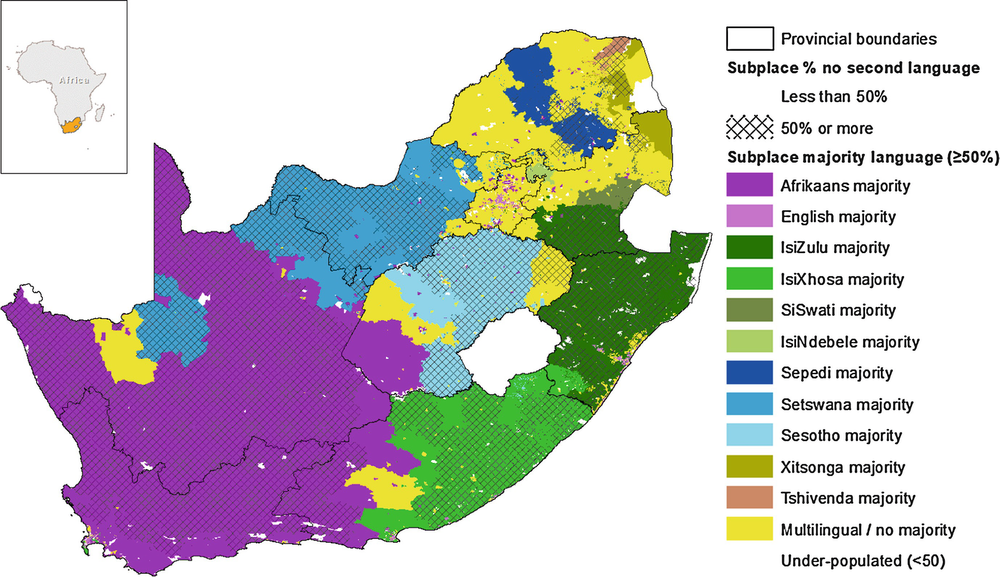

<a id="cont"></a>

## Table of Contents

<a href=#one>1. Importing Packages</a>

<a href=#two>2. Loading Data</a>

<a href=#three>3. Exploratory Data Analysis (EDA)</a>

<a href=#four>4. Data Engineering</a>

<a href=#five>5. Modeling</a>

<a href=#six>6. Model Performance</a>

<a href=#seven>7. Model Explanations</a>

<a href=#seven>8. Refferences</a>

## Timeline

- [X] eda
- [X] engineering
- [X] modeling

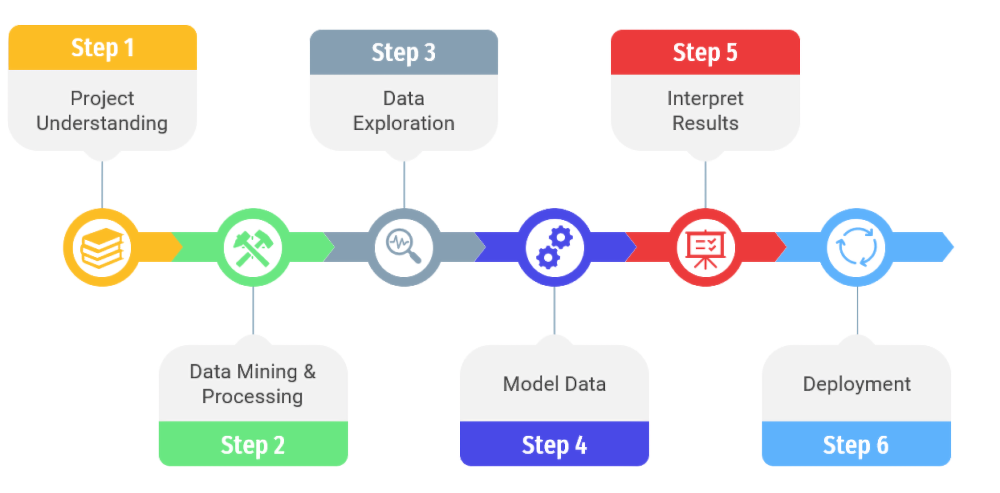

 <a id="one"></a>
### 1. Importing packages
<a href=#cont>Back to Table of Contents</a>

In [1]:
# Importing all the necessary packages
import pandas as pd
import  numpy as np
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt
import seaborn as sns
import re
import string #get info in string, oreprocessing
import nltk
import warnings
%matplotlib inline
warnings.filterwarnings('ignore')
import tensorflow as tf
import numpy as np
from tensorflow import keras
from tensorflow.keras.datasets import mnist
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential
from matplotlib import pyplot as plt
from random import randint
from tensorflow.keras.utils import to_categorical

 <a id="Two"></a>
### 2. Loading data
<a href=#cont>Back to Table of Contents</a>

In [2]:
# Loading the data
train = pd.read_csv('train_set.csv')
test = pd.read_csv('test_set.csv')

In [3]:
train

,lang_id,text
0,xho,umgaqo-siseko wenza amalungiselelo kumaziko ax...
1,xho,i-dha iya kuba nobulumko bokubeka umsebenzi na...
2,eng,the province of kwazulu-natal department of tr...
3,nso,o netefatša gore o ba file dilo ka moka tše le...
4,ven,khomishini ya ndinganyiso ya mbeu yo ewa maana...
...,...,...
32995,tsn,popo ya dipolateforomo tse ke go tlisa boetele...
32996,sot,modise mosadi na o ntse o sa utlwe hore thaban...
32997,eng,closing date for the submission of completed t...
32998,xho,nawuphina umntu ofunyenwe enetyala phantsi kwa...


In [4]:
test

,index,text
0,1,"Mmasepala, fa maemo a a kgethegileng a letlele..."
1,2,Uzakwaziswa ngokufaneleko nakungafuneka eminye...
2,3,Tshivhumbeo tshi fana na ngano dza vhathu.
3,4,Kube inja nelikati betingevakala kutsi titsini...
4,5,Winste op buitelandse valuta.
...,...,...
5677,5678,You mark your ballot in private.
5678,5679,Ge o ka kgetha ka bowena go se šomiše Mofani k...
5679,5680,"E Ka kopo etsa kgetho ya hao ka hloko, hobane ..."
5680,5681,"TB ke bokudi ba PMB, mme Morero o tla lefella ..."


 <a id="one"></a>
### 3. Exploratory data analysis (EDA).
<a href=#cont>Back to Table of Contents</a>

Exploratory data analysis (EDA) is a state of mind, a way of thinking about the data analysis and doing it. EDA emphasises using the visual display to reveal vital information about the examined data. EDA has been used to examine the distribution shape or the relationship between two variables; the aim is to overcome the problems identified by elementary techniques `(Hartwig & Dearing 1979, pp4-7)`. 

The study revealed that the test dataset had 5682 observations, whereas the training dataset contained 33000 observations. There were no null values found in any of the features. However, the researcher observed that the text data had punctuation and text data in capital letters, requiring the researcher to do NLP preprocessing. The visulas relayed that all of the languages were spread evenly, which was predicted given that the goal of this research is to forecast the chance of the text belonging to one of South Africa's 11 official languages.

In [5]:
len(train)

33000

In [6]:
len(test)

5682

In [7]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33000 entries, 0 to 32999
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   lang_id  33000 non-null  object
 1   text     33000 non-null  object
dtypes: object(2)
memory usage: 515.8+ KB


In [8]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5682 entries, 0 to 5681
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   index   5682 non-null   int64 
 1   text    5682 non-null   object
dtypes: int64(1), object(1)
memory usage: 88.9+ KB


In [9]:
train.describe()

,lang_id,text
count,33000,33000
unique,11,29948
top,xho,ngokwesekhtjheni yomthetho ophathelene nalokhu...
freq,3000,17


In [10]:
test.describe()

,index
count,5682.000000
mean,2841.500000
std,1640.396446
min,1.000000
25%,1421.250000
50%,2841.500000
75%,4261.750000
max,5682.000000


#### 3.1. Pre-processing

Remove punctuation marks

In [11]:
#remove special characters numbers and punctuation
train["text"] = train["text"].str.replace("[^a-zA-Z#]"," ")
test["text"] = test["text"].str.replace("[^a-zA-Z#]"," ")
train.head()

,lang_id,text
0,xho,umgaqo siseko wenza amalungiselelo kumaziko ax...
1,xho,i dha iya kuba nobulumko bokubeka umsebenzi na...
2,eng,the province of kwazulu natal department of tr...
3,nso,o netefat a gore o ba file dilo ka moka t e le...
4,ven,khomishini ya ndinganyiso ya mbeu yo ewa maana...


Lower capital letters

In [12]:
#Lowercase conversion
train["text"] = train['text'].str.lower()
test["text"] = test['text'].str.lower()
train.head()

,lang_id,text
0,xho,umgaqo siseko wenza amalungiselelo kumaziko ax...
1,xho,i dha iya kuba nobulumko bokubeka umsebenzi na...
2,eng,the province of kwazulu natal department of tr...
3,nso,o netefat a gore o ba file dilo ka moka t e le...
4,ven,khomishini ya ndinganyiso ya mbeu yo ewa maana...


In [13]:
train.tail()

,lang_id,text
32995,tsn,popo ya dipolateforomo tse ke go tlisa boetele...
32996,sot,modise mosadi na o ntse o sa utlwe hore thaban...
32997,eng,closing date for the submission of completed t...
32998,xho,nawuphina umntu ofunyenwe enetyala phantsi kwa...
32999,sot,mafapha a mang le ona a lokela ho etsa ditlale...


In [14]:
!pip install WordCloud

<AxesSubplot:xlabel='lang_id', ylabel='count'>

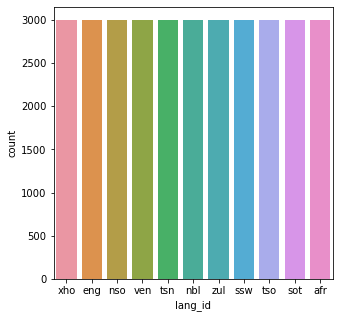

In [15]:
#Distribution of all languages
fig= plt.figure(figsize = (5,5))
sns.countplot(x = 'lang_id', data = train)

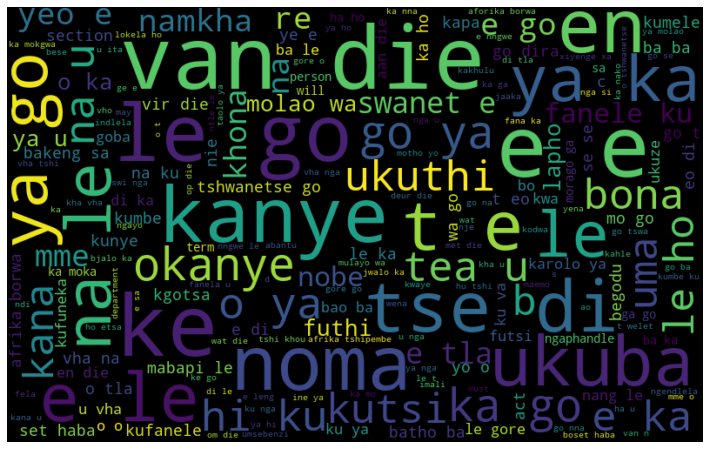

In [16]:
# visualize frequent words
#firat combine all words in single string
all_words = " ".join([sentence for sentence in train["text"]])
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state=42, max_font_size=100).generate(all_words)

#plot graph
plt.figure(figsize=(15,8))
plt.imshow(wordcloud, interpolation= 'bilinear')
plt.axis('off')
plt.show()

Text(0.5, 1.0, 'Distribution of sentiments')

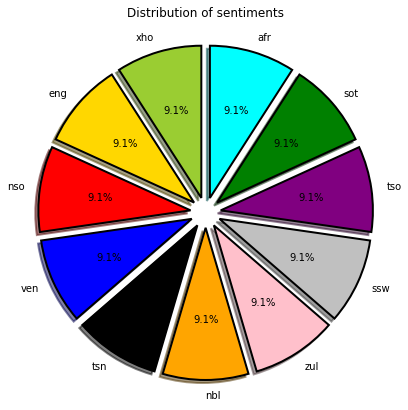

In [17]:
#pie of sentiments
fig = plt.figure(figsize=(7,7))
colors = ('yellowgreen', 'gold', 'red', 'blue', 'black', 'orange', 'pink', 'silver', 'purple', 'green', 'aqua')
wp = {'linewidth':2, 'edgecolor':'black'}
tags = train['lang_id'].value_counts()
explode = (0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1)
tags.plot(kind='pie', autopct='%1.1f%%', shadow=True, colors = colors,
         startangle=90, wedgeprops = wp, explode =  explode, label = '')
plt.title('Distribution of sentiments')

In [18]:
from nltk.stem import WordNetLemmatizer

In [19]:
#Tokenize into tokens
tokenized_train = train["text"].apply(lambda x: x.split())
tokenized_test=test["text"].apply(lambda x: x.split())

In [20]:
tokenized_train.head()

0    [umgaqo, siseko, wenza, amalungiselelo, kumazi...
1    [i, dha, iya, kuba, nobulumko, bokubeka, umseb...
2    [the, province, of, kwazulu, natal, department...
3    [o, netefat, a, gore, o, ba, file, dilo, ka, m...
4    [khomishini, ya, ndinganyiso, ya, mbeu, yo, ew...
Name: text, dtype: object

 <a id="Two"></a>
### 4. Data engineering
<a href=#cont>Back to Table of Contents</a>


Data engineering is about creating and maintaining the underlying systems that collect and report data. Without data engineering, the collected data would be inconsistent and the information it tells us would not be beneficial `(Gray & Shenoy 2000, pp 3-10)`. At this stage, the researcher used the Countvectorizer to convert text to numerical data.


In [21]:
from sklearn.feature_extraction.text import CountVectorizer
betterVect = CountVectorizer(stop_words='english',
                             min_df=2,
                             max_df=0.5,
                             max_features = 2000000,
                             ngram_range=(1, 1))

In [22]:
# Creating X and y 
X = betterVect.fit_transform(train['text'])
y = train['lang_id']

In [23]:
from sklearn import preprocessing

#scale my data
from sklearn.model_selection import train_test_split

scaler = preprocessing.MaxAbsScaler()

x_scaled =scaler.fit_transform(X)

x_train, x_test, y_train, y_test =train_test_split(x_scaled, y, test_size = 0.2, random_state = 42)

In [24]:
print("size of x_train:", (x_train.shape))
print("size of y_train:", (y_train.shape))
print("size of x_test:", (x_test.shape))
print("size of y_test:", (y_test.shape))

size of x_train: (26400, 63145)
size of y_train: (26400,)
size of x_test: (6600, 63145)
size of y_test: (6600,)


 <a id="Two"></a>
### 5. Modelling
<a href=#cont>Back to Table of Contents</a>

A machine learning model is a file that has been trained to recognize certain types of patterns. You train a model over a set of data, providing an algorithm that it can use to reason over and learn from those data `(Song, Rinsternpart & Shmatikov 2017, pp 587-601)`.The logistic regression, support vector model, decision trees, and random forest models were used in this study. The logistic regression model outperforms the other model with a 99.76 percent accuracy score on training data and an 87 percent accuracy score on unseen data.

**Logistic regression**

In [25]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(max_iter=9000000)
logreg.fit(x_train, y_train)

lr_pred = logreg.predict(x_test)

In [26]:
from sklearn.metrics import classification_report, accuracy_score

report = classification_report(y_test, lr_pred)
print("The accuracy score of the SVC is:", accuracy_score(y_test, lr_pred))
print(report)

The accuracy score of the SVC is: 0.9975757575757576
              precision    recall  f1-score   support

         afr       1.00      0.99      1.00       583
         eng       0.99      1.00      1.00       615
         nbl       1.00      1.00      1.00       583
         nso       1.00      1.00      1.00       625
         sot       1.00      1.00      1.00       618
         ssw       1.00      1.00      1.00       584
         tsn       1.00      1.00      1.00       598
         tso       1.00      1.00      1.00       561
         ven       1.00      1.00      1.00       634
         xho       1.00      1.00      1.00       609
         zul       0.99      0.99      0.99       590

    accuracy                           1.00      6600
   macro avg       1.00      1.00      1.00      6600
weighted avg       1.00      1.00      1.00      6600



**Support vector model**

In [27]:
from sklearn.svm import SVC

svc = SVC(kernel='linear')
svc.fit(x_train, y_train)
sv_pred = svc.predict(x_test)

print("The accuracy score of the SVC is:", accuracy_score(y_test, sv_pred))
print("\n\nClassification Report:\n\n", classification_report(y_test, sv_pred))

The accuracy score of the SVC is: 0.9971212121212121


Classification Report:

               precision    recall  f1-score   support

         afr       1.00      0.99      1.00       583
         eng       0.99      1.00      1.00       615
         nbl       0.99      0.99      0.99       583
         nso       1.00      0.99      1.00       625
         sot       1.00      1.00      1.00       618
         ssw       1.00      1.00      1.00       584
         tsn       1.00      1.00      1.00       598
         tso       1.00      1.00      1.00       561
         ven       1.00      1.00      1.00       634
         xho       1.00      1.00      1.00       609
         zul       0.99      0.99      0.99       590

    accuracy                           1.00      6600
   macro avg       1.00      1.00      1.00      6600
weighted avg       1.00      1.00      1.00      6600



**Decision tree**

In [28]:
from sklearn.tree import DecisionTreeClassifier

In [29]:
tree = DecisionTreeClassifier(random_state=42)
tree.fit(x_train, y_train)
dt_pred = svc.predict(x_test)

In [30]:

print("The accuracy score of the SVC is:", accuracy_score(y_test, dt_pred))
print("\n\nClassification Report:\n\n", classification_report(y_test, dt_pred))

The accuracy score of the SVC is: 0.9971212121212121


Classification Report:

               precision    recall  f1-score   support

         afr       1.00      0.99      1.00       583
         eng       0.99      1.00      1.00       615
         nbl       0.99      0.99      0.99       583
         nso       1.00      0.99      1.00       625
         sot       1.00      1.00      1.00       618
         ssw       1.00      1.00      1.00       584
         tsn       1.00      1.00      1.00       598
         tso       1.00      1.00      1.00       561
         ven       1.00      1.00      1.00       634
         xho       1.00      1.00      1.00       609
         zul       0.99      0.99      0.99       590

    accuracy                           1.00      6600
   macro avg       1.00      1.00      1.00      6600
weighted avg       1.00      1.00      1.00      6600



**Random forest model**

In [31]:
from sklearn.ensemble import RandomForestClassifier

In [32]:
#Training the R_forest model
forest = RandomForestClassifier(n_estimators=100, random_state=42)
forest.fit(x_train, y_train)

RandomForestClassifier(random_state=42)

In [33]:
p_forest = forest.predict(x_test)

print("The accuracy score of the SVC is:", accuracy_score(y_test, p_forest))
print("\n\nClassification Report:\n\n", classification_report(y_test, p_forest))


The accuracy score of the SVC is: 0.9786363636363636


Classification Report:

               precision    recall  f1-score   support

         afr       0.99      1.00      1.00       583
         eng       0.94      1.00      0.97       615
         nbl       0.97      0.93      0.95       583
         nso       1.00      0.99      0.99       625
         sot       1.00      1.00      1.00       618
         ssw       0.98      0.96      0.97       584
         tsn       0.99      0.99      0.99       598
         tso       1.00      1.00      1.00       561
         ven       1.00      1.00      1.00       634
         xho       0.98      0.94      0.96       609
         zul       0.92      0.95      0.94       590

    accuracy                           0.98      6600
   macro avg       0.98      0.98      0.98      6600
weighted avg       0.98      0.98      0.98      6600



<a id="six"></a>
## 6. Model perfomance
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---

Logistic regression model

In [34]:
# LOGISTIC REGRESSION
from sklearn.metrics import accuracy_score
#Calculate the accuracy of the model
logreg_acc = accuracy_score(lr_pred, y_test)

#print accuracy
print("Test accuracy: {:.2f}%".format(logreg_acc*100))

Test accuracy: 99.76%


Support vector model

In [35]:
from sklearn.metrics import accuracy_score
#Calculate the accuracy of the model
logreg_acc = accuracy_score(sv_pred, y_test)

#print accuracy
print("Test accuracy: {:.2f}%".format(logreg_acc*100))

Test accuracy: 99.71%


Decission tree model

In [36]:
from sklearn.metrics import accuracy_score
#Calculate the accuracy of the model
logreg_acc = accuracy_score(dt_pred, y_test)

#print accuracy
print("Test accuracy: {:.2f}%".format(logreg_acc*100))

Test accuracy: 99.71%


Randome forest model

In [37]:
from sklearn.metrics import accuracy_score
#Calculate the accuracy of the model
logreg_acc = accuracy_score(p_forest, y_test)

#print accuracy
print("Test accuracy: {:.2f}%".format(logreg_acc*100))

Test accuracy: 97.86%


<a id="seven"></a>
## 7. Output CSV OF best perfoming model
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---

In [38]:
A_test = betterVect.transform(test['text'])

In [39]:
A_test.shape[0]

5682

In [40]:
r_pred = logreg.predict(A_test)

In [41]:
test['text'] = r_pred

In [42]:
test['lang_id'] = test['text']

In [43]:
test.drop(['text'],axis = 1, inplace =True)

In [44]:
test

,index,lang_id
0,1,tsn
1,2,nbl
2,3,ven
3,4,ssw
4,5,afr
...,...,...
5677,5678,eng
5678,5679,nso
5679,5680,sot
5680,5681,sot


In [45]:
test.to_csv('outcome7.csv', index = False)

<a id="seven"></a>
## 8. Refferences
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---

[(The articles are available on google scholar)](https://scholar.google.com/scholar?hl=en&as_sdt=0,5&q=what+is+data+engineering#d=gs_cit&t=1656164100451&u=%2Fscholar%3Fq%3Dinfo%3AV9k9GEPRiFUJ%3Ascholar.google.com%2F%26output%3Dcite%26scirp%3D0%26hl%3Den)

[(The visuals were extracted from google)](https://www.google.com/search?q=south+african+languages&tbm=isch&ved=2ahUKEwit4Kbl7cj4AhVKgc4BHcnfDkkQ2-cCegQIABAA&oq=south+african+languages&gs_lcp=CgNpbWcQAzIECCMQJzIFCAAQgAQyBQgAEIAEMgUIABCABDIFCAAQgAQyBQgAEIAEMgUIABCABDIGCAAQHhAFMgYIABAeEAUyBggAEB4QBToHCCMQ6gIQJzoECAAQQzoICAAQsQMQgwE6BwgAELEDEEM6CggAELEDEIMBEEM6CAgAEIAEELEDOgsIABCABBCxAxCDAVC9BViBOGCUOWgBcAB4BIABpASIAYtEkgEKMi0yMC4zLjQuMZgBAKABAaoBC2d3cy13aXotaW1nsAEKwAEB&sclient=img&ei=nSG3Yu2dD8qCur4Pyb-7yAQ&bih=760&biw=1536#imgrc=bAFyQPAgDGrjCM)

Hartwig, F. and Dearing, B.E., 1979. Exploratory data analysis (No. 16). Sage.

Song, C., Ristenpart, T. and Shmatikov, V., 2017, October. Machine learning models that remember too much. In Proceedings of the 2017 ACM SIGSAC Conference on computer and communications security (pp. 587-601).